# 1. Dataset Exploration (EDA)

In [31]:
import pandas as pd

df1 = pd.read_csv("images/images.csv")
df2 = pd.read_csv(
    "styles/styles.csv",
    on_bad_lines="skip"
)

print(df1.head())


    filename                                               link
0  15970.jpg  http://assets.myntassets.com/v1/images/style/p...
1  39386.jpg  http://assets.myntassets.com/v1/images/style/p...
2  59263.jpg  http://assets.myntassets.com/v1/images/style/p...
3  21379.jpg  http://assets.myntassets.com/v1/images/style/p...
4  53759.jpg  http://assets.myntassets.com/v1/images/style/p...


In [32]:
print(df2.head())

      id gender masterCategory subCategory  articleType baseColour  season  \
0  15970    Men        Apparel     Topwear       Shirts  Navy Blue    Fall   
1  39386    Men        Apparel  Bottomwear        Jeans       Blue  Summer   
2  59263  Women    Accessories     Watches      Watches     Silver  Winter   
3  21379    Men        Apparel  Bottomwear  Track Pants      Black    Fall   
4  53759    Men        Apparel     Topwear      Tshirts       Grey  Summer   

     year   usage                             productDisplayName  
0  2011.0  Casual               Turtle Check Men Navy Blue Shirt  
1  2012.0  Casual             Peter England Men Party Blue Jeans  
2  2016.0  Casual                       Titan Women Silver Watch  
3  2011.0  Casual  Manchester United Men Solid Black Track Pants  
4  2012.0  Casual                          Puma Men Grey T-shirt  


In [33]:
print("Images CSV shape:", df1.shape)
print("Styles CSV shape:", df2.shape)


Images CSV shape: (44446, 2)
Styles CSV shape: (44424, 10)


In [34]:
print(df1.columns)
print(df2.columns)


Index(['filename', 'link'], dtype='object')
Index(['id', 'gender', 'masterCategory', 'subCategory', 'articleType',
       'baseColour', 'season', 'year', 'usage', 'productDisplayName'],
      dtype='object')


In [35]:
for col in df1.columns:
    print(col)

filename
link


In [36]:
for col in df2.columns:
    print(col)


id
gender
masterCategory
subCategory
articleType
baseColour
season
year
usage
productDisplayName


In [37]:
print("Total images:", len(df1))
print("Total style entries:", len(df2))


Total images: 44446
Total style entries: 44424


In [38]:
import pandas as pd

df1 = pd.read_csv("images/images.csv")
df2 = pd.read_csv("styles/styles.csv", on_bad_lines="skip")

df1["id"] = df1["filename"].str.replace(".jpg", "", regex=False).astype(int)

df = df1.merge(df2, on="id")

print("Merged dataset shape:", df.shape)



Merged dataset shape: (44424, 12)


In [39]:
target_col = "articleType"

print("Number of classes:", df[target_col].nunique())
print(df[target_col].value_counts())


Number of classes: 143
articleType
Tshirts                7067
Shirts                 3217
Casual Shoes           2845
Watches                2542
Sports Shoes           2036
                       ... 
Cushion Covers            1
Mens Grooming Kit         1
Body Wash and Scrub       1
Suits                     1
Ipad                      1
Name: count, Length: 143, dtype: int64


In [40]:
from PIL import Image
import requests
from io import BytesIO

url = df.loc[0, "link"]
response = requests.get(url)
img = Image.open(BytesIO(response.content))

print("Image size:", img.size)
print("Image mode:", img.mode)


Image size: (1800, 2400)
Image mode: RGB


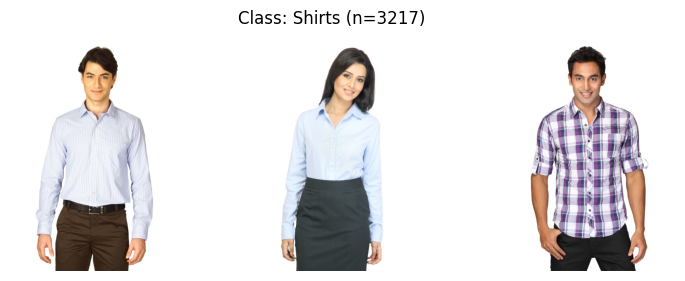

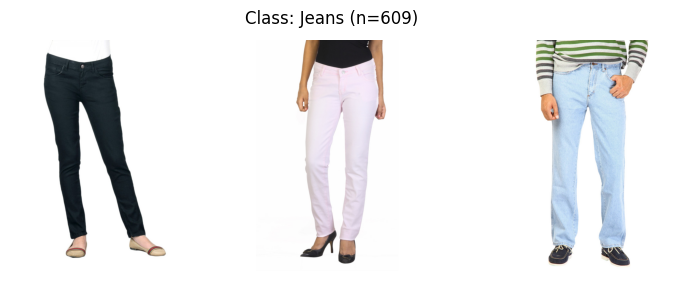

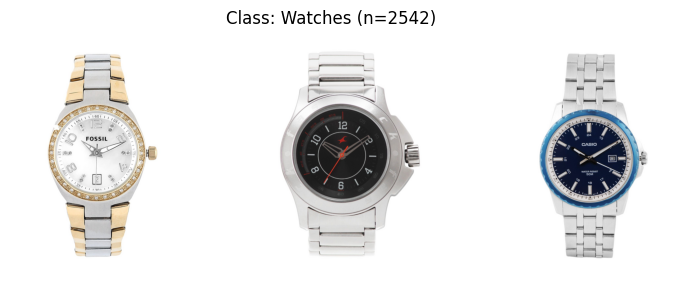

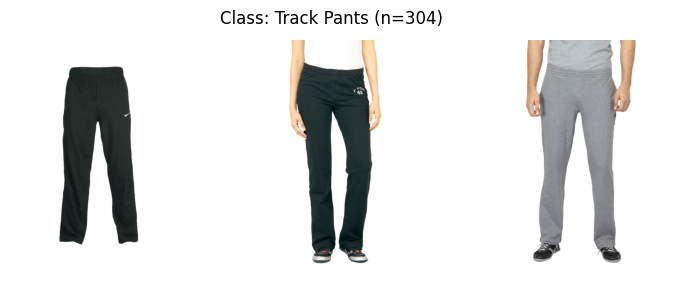

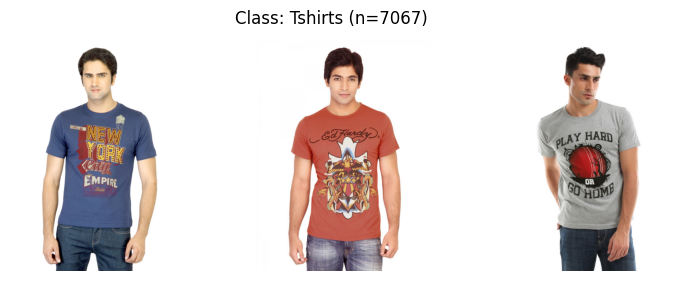

...

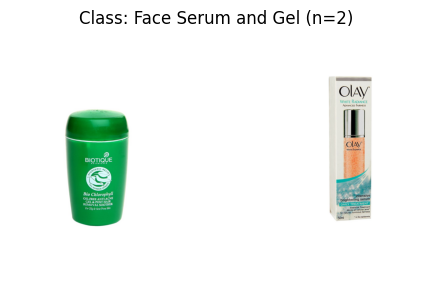

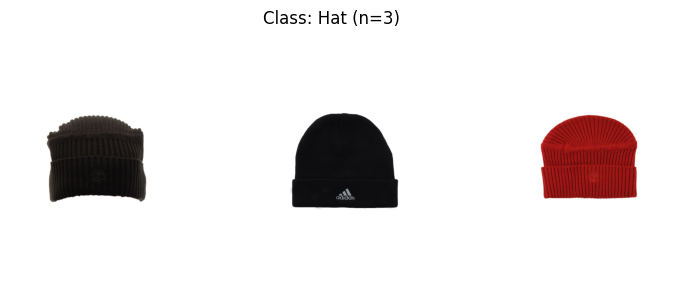

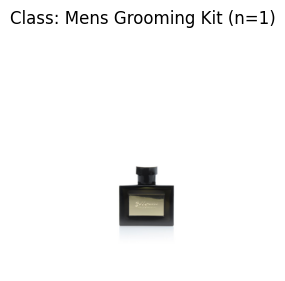

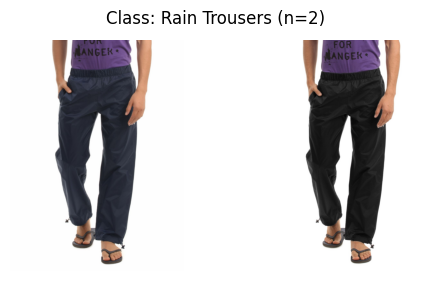

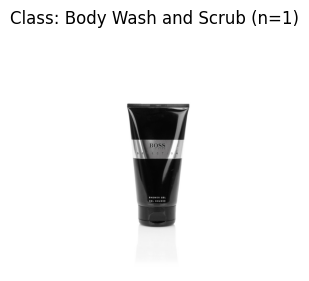

<Figure size 300x300 with 0 Axes>

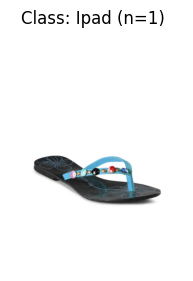

In [41]:
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

def show_samples_per_class(df, target_col, samples=3):
    classes = df[target_col].unique()

    for cls in classes:
        cls_data = df[df[target_col] == cls]
        n = min(samples, len(cls_data))

        if n == 0:
            continue

        cls_df = cls_data.sample(n, random_state=42)

        plt.figure(figsize=(n * 3, 3))
        plt.suptitle(f"Class: {cls} (n={len(cls_data)})")

        for i, (_, row) in enumerate(cls_df.iterrows()):
            try:
                img = Image.open(BytesIO(requests.get(row["link"], timeout=5).content))
                plt.subplot(1, n, i + 1)
                plt.imshow(img)
                plt.axis("off")
            except Exception:
                pass  # skip broken images

        plt.show()



show_samples_per_class(df, target_col="articleType")


In [43]:
import numpy as np

img_resized = img.resize((224, 224))
img_array = np.array(img_resized) / 255.0
